<a href="https://colab.research.google.com/github/wingated/cs474_labs_f2019/blob/master/DL_Lab5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Neural Style Transfer

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms
from tqdm import tqdm
from torch.nn.parameter import Parameter
from PIL import Image
import io
from IPython.core.ultratb import AutoFormattedTB
__ITB__ = AutoFormattedTB(mode = 'Verbose', color_scheme='LightBg', tb_offset = 1)

from google.colab import files

In [4]:
# upload content and style images
load_and_normalize = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224,224)),
    transforms.ToTensor(),
])

def upload():
  print('Upload Content Image')
  file_dict = files.upload()
  content_path = io.BytesIO(file_dict[next(iter(file_dict))])

  print('\nUpload Style Image')
  file_dict = files.upload()
  style_path = io.BytesIO(file_dict[next(iter(file_dict))])
  return content_path, style_path

content_path, style_path = upload()

print("Content Path: {}".format(content_path))
print("Style Path: {}".format(style_path))


Upload Content Image


Saving ha_long_bay.png to ha_long_bay (1).png

Upload Style Image


Saving colors_dc_temp.png to colors_dc_temp.png
Content Path: <_io.BytesIO object at 0x7aa3885eeca0>
Style Path: <_io.BytesIO object at 0x7aa38ab57150>


In [5]:
content_image_orig = Image.open(content_path)
content_image = load_and_normalize(np.array(content_image_orig)).unsqueeze(0).cuda()
style_image_orig = Image.open(style_path)
style_image = load_and_normalize(np.array(style_image_orig)).unsqueeze(0).cuda()

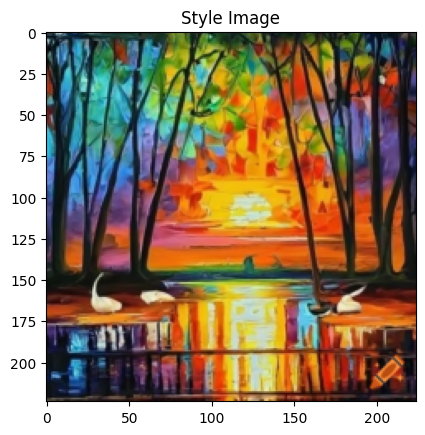

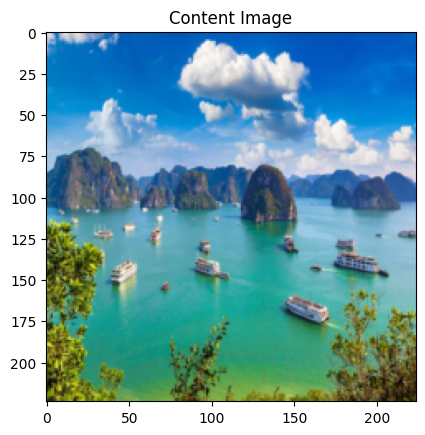

In [6]:
# Display the images
toPIL = transforms.ToPILImage()

def display(tensor, title=None):
    image = tensor.cpu().clone()
    image = image.squeeze(0)
    image = toPIL(image)
    plt.imshow(image)
    if title is not None:
        plt.title(title)

plt.figure()
display(style_image, title='Style Image')

plt.figure()
display(content_image, title='Content Image')


In [7]:
assert torch.cuda.is_available(), "You need to request a GPU from Runtime > Change Runtime"
print(f'Number of Cuda Devices: {torch.cuda.device_count()}')
print(f'Cuda Device: {torch.cuda.get_device_name()}')
print(f'Memory that can be Allocated to GPU: {torch.cuda.get_device_properties(0).total_memory/ 1e9} GB')

Number of Cuda Devices: 1
Cuda Device: NVIDIA A100-SXM4-40GB
Memory that can be Allocated to GPU: 42.481811456 GB


In [8]:
import torchvision.models as models

class Normalization(nn.Module):
  def __init__(self, mean=torch.tensor([0.485, 0.456, 0.406]).cuda(), std=torch.tensor([0.229, 0.224, 0.225]).cuda()):
      super(Normalization, self).__init__()
      self.mean = torch.tensor(mean).view(-1, 1, 1)
      self.std = torch.tensor(std).view(-1, 1, 1)

  def forward(self, img):
      return (img - self.mean) / self.std

class VGGIntermediate(nn.Module):
  def __init__(self, requested=[]):
    super(VGGIntermediate, self).__init__()
    self.norm = Normalization().eval()
    self.intermediates = {}
    self.vgg = models.vgg16(pretrained=True).features.eval()
    for i, m in enumerate(self.vgg.children()):
        if isinstance(m, nn.ReLU): 
          m.inplace = False          

        if i in requested:
          def curry(i):
            def hook(module, input, output):
              self.intermediates[i] = output
            return hook
          m.register_forward_hook(curry(i))

  def forward(self, x):
    self.vgg(self.norm(x))
    return self.intermediates

In [9]:
vgg_names = ["conv1_1", "relu1_1", "conv1_2", "relu1_2", "maxpool1", "conv2_1", "relu2_1", "conv2_2", "relu2_2", "maxpool2", "conv3_1", "relu3_1", "conv3_2", "relu3_2", "conv3_3", "relu3_3","maxpool3", "conv4_1", "relu4_1", "conv4_2", "relu4_2", "conv4_3", "relu4_3","maxpool4", "conv5_1", "relu5_1", "conv5_2", "relu5_2", "conv5_3", "relu5_3","maxpool5"]

# Choose the layers to use for style and content transfer
content_layers = ['conv4_2']
style_layers = ['conv1_1', 'conv2_1', 'conv3_1', 'conv4_1', 'conv5_1']

# Create the vgg network in eval mode
layer_to_index = {vgg_names[i]: i for i in range(len(vgg_names))}

requested_layers = [layer_to_index[layer] for layer in content_layers + style_layers]
vgg = VGGIntermediate(requested=requested_layers).cuda()

# Cache the outputs of the content and style layers for their respective images
content_features = {layer: vgg(content_image)[layer_to_index[layer]] for layer in content_layers} 
style_features = {layer: vgg(style_image)[layer_to_index[layer]] for layer in style_layers}

<ipython-input-8-4e86d2def5ec>:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.mean = torch.tensor(mean).view(-1, 1, 1)
<ipython-input-8-4e86d2def5ec>:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.std = torch.tensor(std).view(-1, 1, 1)
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior

In [10]:
def gram_matrix(input):
    a, b, c, d = input.size()
    features = input.view(a * b, c * d)
    G = torch.mm(features, features.t())
    return G.div(a * b * c * d)

class ContentLoss(nn.Module):

    def __init__(self, target,):
        super(ContentLoss, self).__init__()
        self.target = target.detach()

    def forward(self, input):
        self.loss = F.mse_loss(input, self.target)
        return input

class StyleLoss(nn.Module):

    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target = gram_matrix(target_feature).detach()

    def forward(self, input):
        G = gram_matrix(input)
        self.loss = F.mse_loss(G, self.target)
        return input

content_losses = []
style_losses = []

model = nn.Sequential(vgg.norm)
i=1
j=1
for layer, step in zip(vgg_names, vgg.vgg.children()):
    model.add_module(layer, step)
    if layer in content_layers:
        target = model(content_image).detach()
        content_loss = ContentLoss(target)
        model.add_module("content_loss_{}".format(i), content_loss)
        content_losses.append(content_loss)
        i+=1
    if layer in style_layers:
        target_feature = model(style_image).detach()
        style_loss = StyleLoss(target_feature)
        model.add_module("style_loss_{}".format(j), style_loss)
        style_losses.append(style_loss)
        j+=1



Step: 0, Style Loss : 289.495178, Content Loss: 0.000000:   0%|          | 1/1200 [00:00<10:19,  1.94it/s]

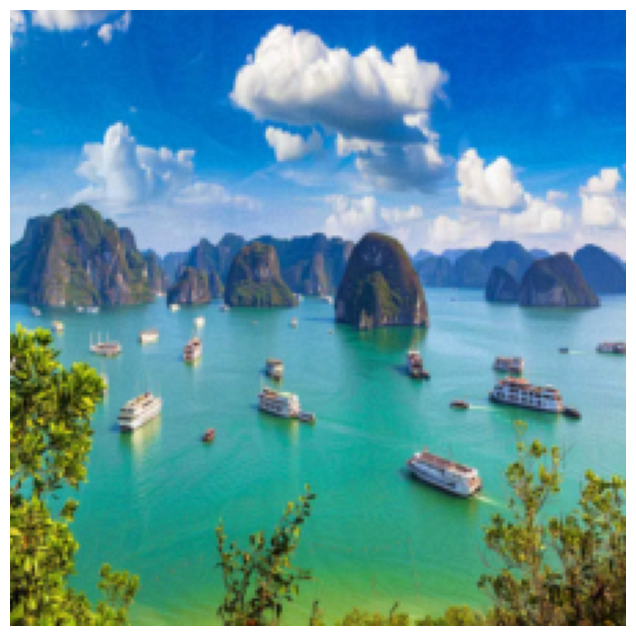

Step: 100, Style Loss : 6.628175, Content Loss: 0.147951:   8%|▊         | 100/1200 [00:01<00:11, 98.89it/s]

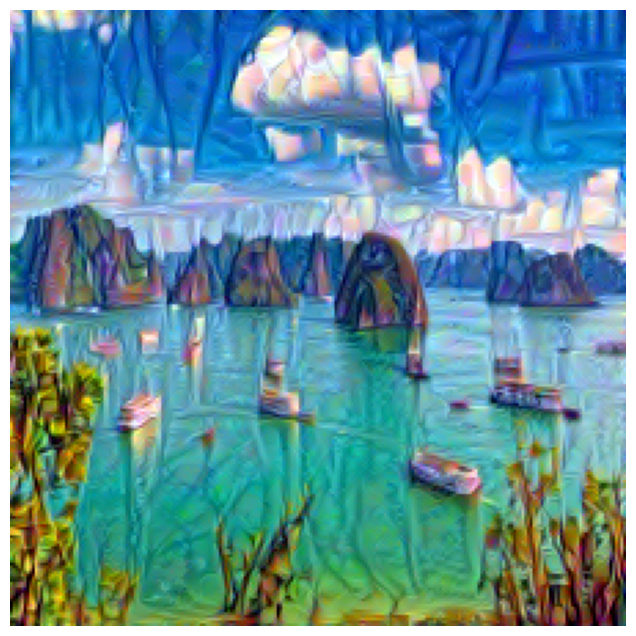

Step: 200, Style Loss : 3.724219, Content Loss: 0.161253:  17%|█▋        | 200/1200 [00:03<00:09, 107.02it/s]

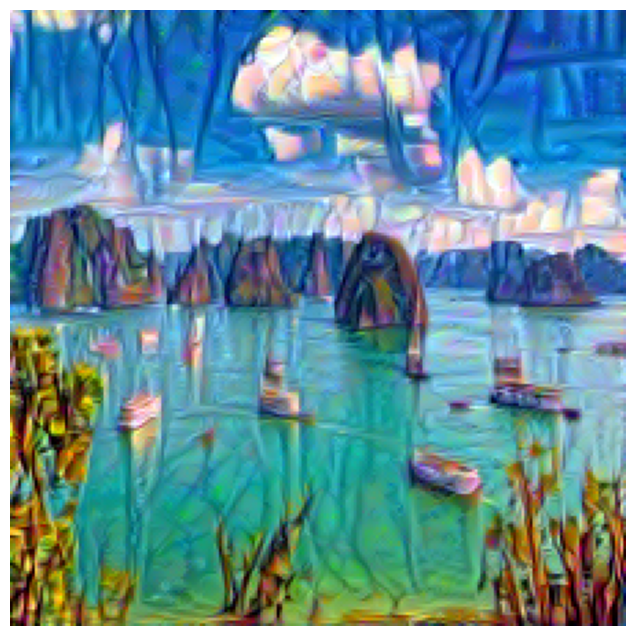

Step: 300, Style Loss : 2.620289, Content Loss: 0.166485:  25%|██▌       | 300/1200 [00:04<00:08, 106.87it/s]

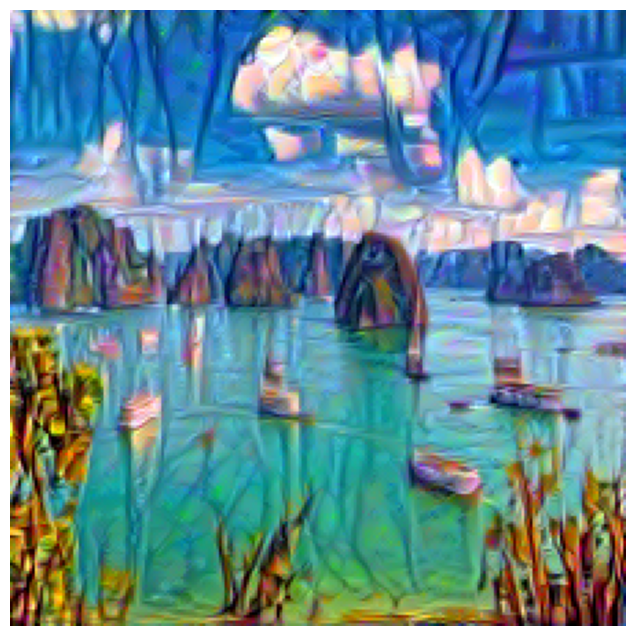

Step: 400, Style Loss : 2.020163, Content Loss: 0.169426:  33%|███▎      | 400/1200 [00:05<00:07, 110.39it/s]

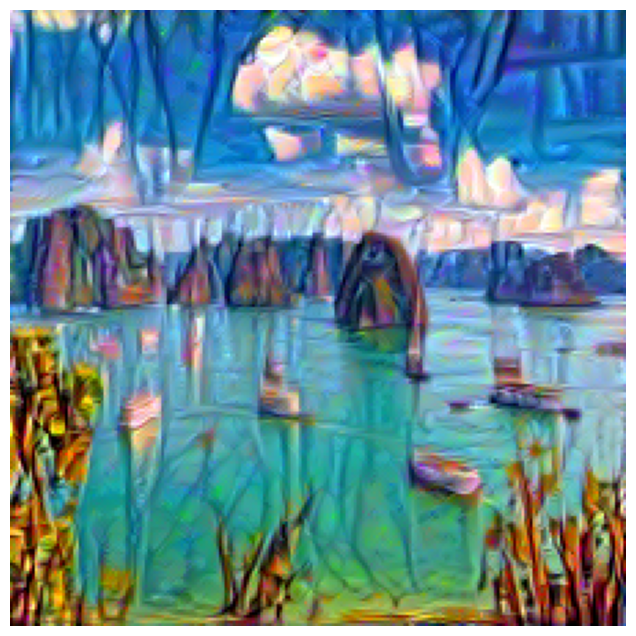

Step: 500, Style Loss : 1.645936, Content Loss: 0.171382:  42%|████▏     | 500/1200 [00:06<00:06, 110.24it/s]

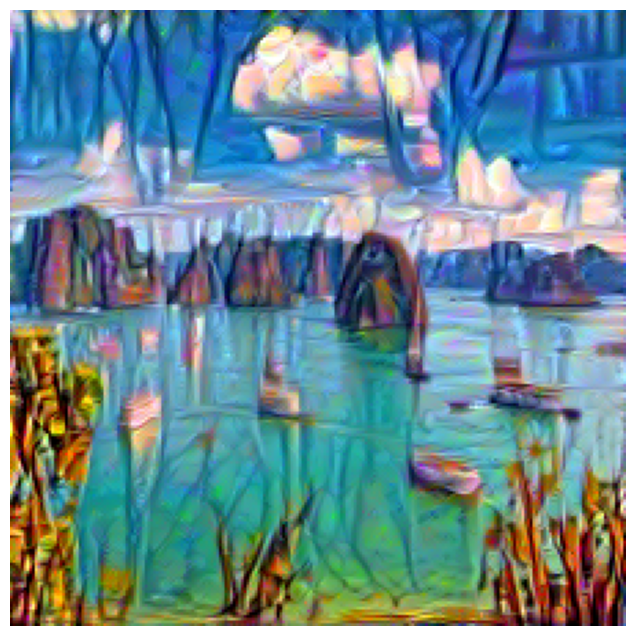

Step: 600, Style Loss : 1.390946, Content Loss: 0.172990:  50%|█████     | 600/1200 [00:08<00:05, 107.57it/s]

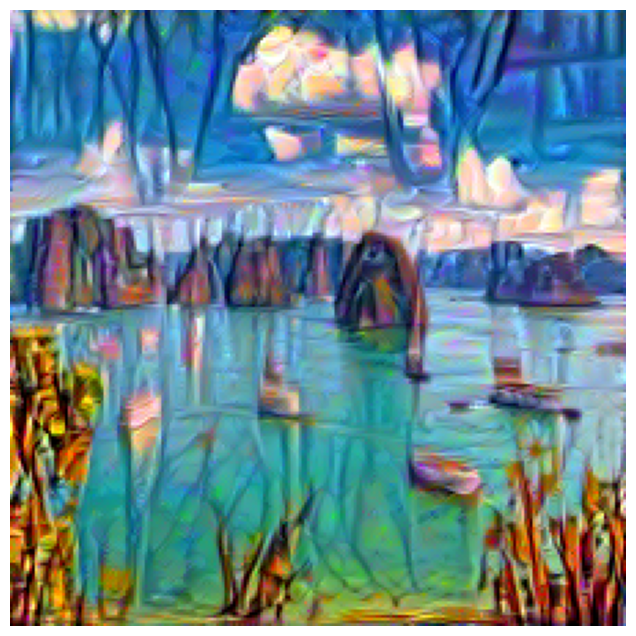

Step: 700, Style Loss : 1.218379, Content Loss: 0.173377:  58%|█████▊    | 700/1200 [00:09<00:04, 109.25it/s]

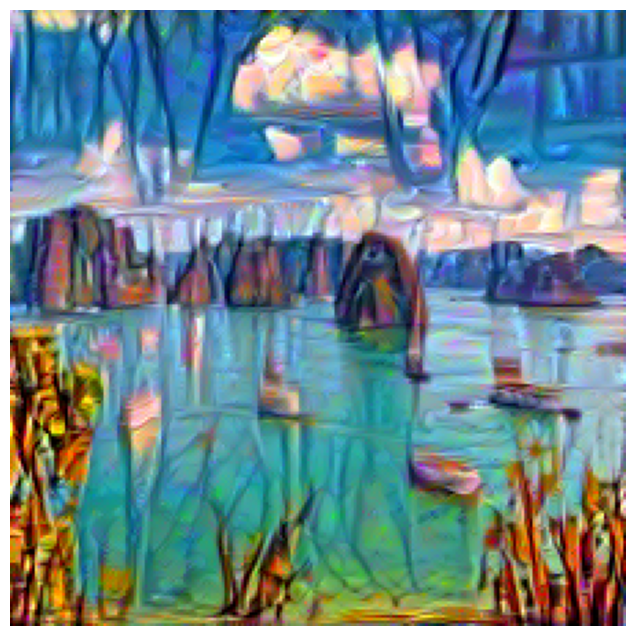

Step: 800, Style Loss : 1.069646, Content Loss: 0.174059:  67%|██████▋   | 800/1200 [00:10<00:03, 112.34it/s]

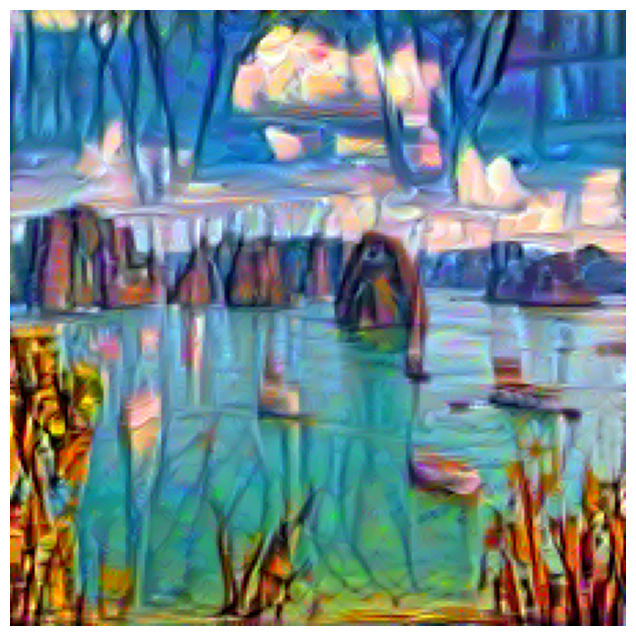

Step: 900, Style Loss : 0.955574, Content Loss: 0.174928:  75%|███████▌  | 900/1200 [00:11<00:02, 108.95it/s]

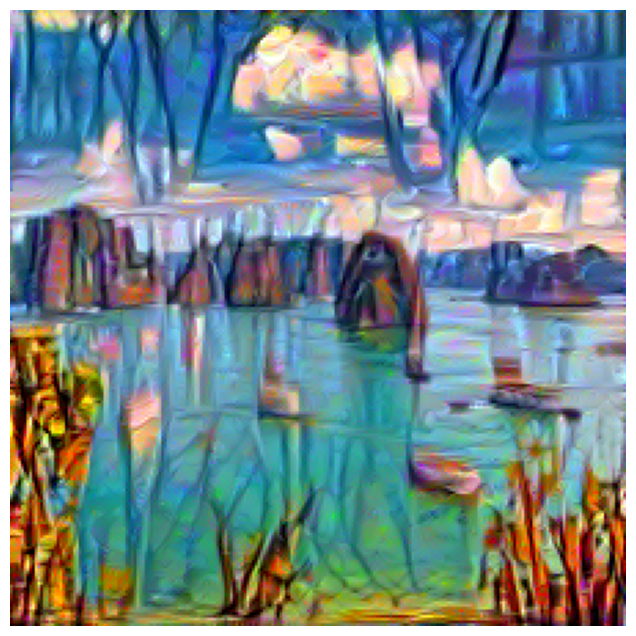

Step: 1000, Style Loss : 0.879021, Content Loss: 0.174015:  83%|████████▎ | 1000/1200 [00:13<00:01, 105.50it/s]

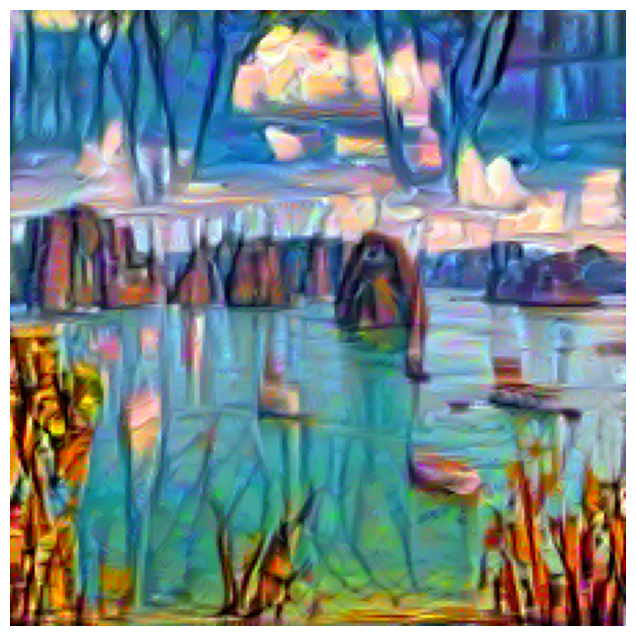

Step: 1100, Style Loss : 0.798603, Content Loss: 0.174815:  92%|█████████▏| 1100/1200 [00:14<00:00, 109.52it/s]

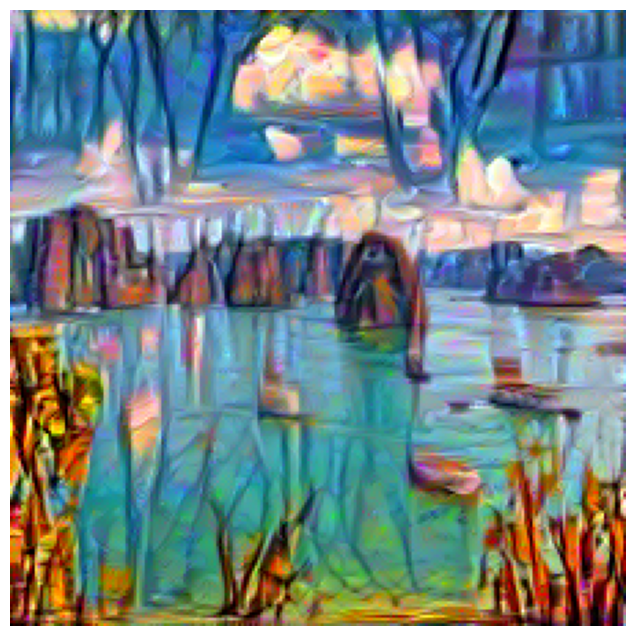

Step: 1200, Style Loss : 0.732023, Content Loss: 0.174396: 100%|██████████| 1200/1200 [00:15<00:00, 105.80it/s]

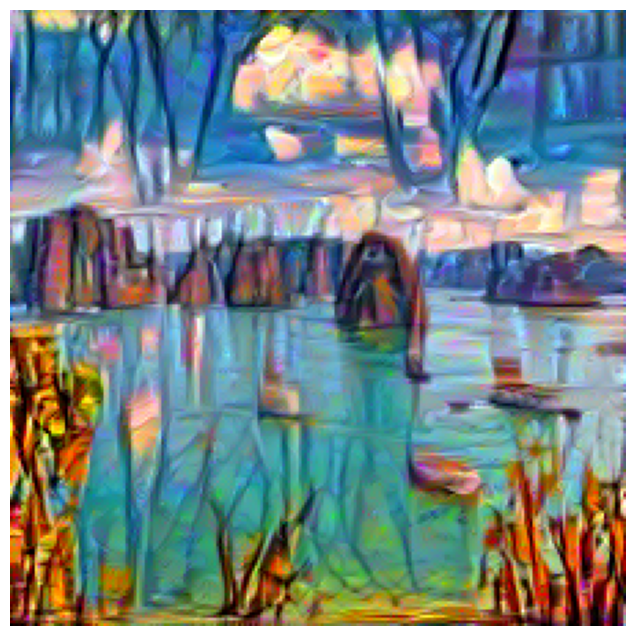

Step: 1200, Style Loss : 0.732023, Content Loss: 0.174396: : 1201it [00:15, 75.38it/s]                         


In [11]:
# copy of the content image
input_img = content_image.clone().requires_grad_(True)

# Set the optimizer to update the image
optimizer = optim.Adam([input_img], lr=0.008)

# Run the optimizer on the images to change the image
steps = 1200
style_weight = 1400 #beta
content_weight = 0.001 #alpha

loop = tqdm(total=len(list(range(steps))), position=0, colour="green")

for i in range(steps+1):

    with torch.no_grad():
        input_img.clamp_(0, 1)

    optimizer.zero_grad()
    model(input_img)
    style = 0
    content = 0

    for sl in style_losses:
        style += sl.loss
    for cl in content_losses:
        content += cl.loss

    style *= style_weight
    content *= content_weight

    loss = style + content
    loss.backward()

    loop.set_description('Step: {}, Style Loss : {:4f}, Content Loss: {:4f}'.format(i, style.item(), content.item()))
    loop.update(1)

    optimizer.step()

    if i % 100 == 0:
        with torch.no_grad():

            image = input_img.cpu().clone().detach()
            image = image.squeeze(0)
            image = image.clamp_(0, 1)
            image = image.permute(1, 2, 0)
            image = image.numpy()

            plt.figure(figsize=(8, 8))
            plt.imshow(image)
            plt.axis('off')  # Hide the axis
            plt.show()

loop.close()

# Show the image

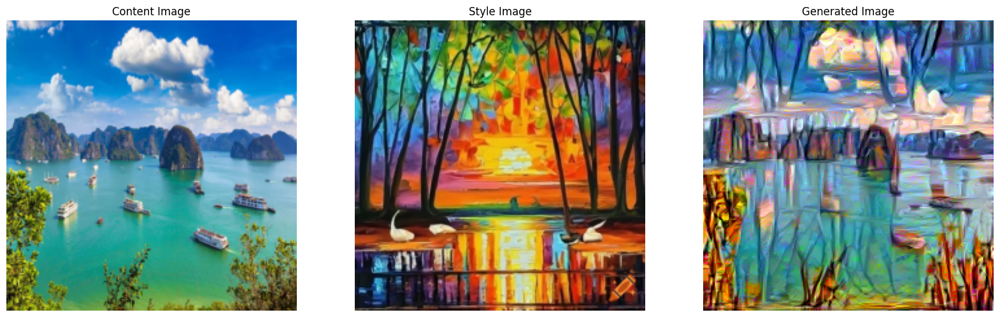

In [12]:
# show the style and content image and final image
image = input_img.cpu().clone().detach()
image = image.squeeze(0)
image = image.clamp_(0, 1)
image = image.permute(1, 2, 0)
image = image.numpy()

plt.figure(figsize=(20, 16))  # You can adjust the size as needed
plt.subplot(131)
display(content_image, title='Content Image')
plt.axis('off')
plt.subplot(132)
display(style_image, title='Style Image')
plt.axis('off')
plt.subplot(133)
plt.imshow(image)
plt.title('Generated Image')
plt.axis('off')
plt.show()